## Installing Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras import models
from keras import layers
from keras import optimizers
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.preprocessing import image
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator



## Loading dataset information

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp /content/gdrive/MyDrive/ITI/DL/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists
cp: cannot stat '/content/gdrive/MyDrive/ITI/DL/kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
! kaggle competitions download state-farm-distracted-driver-detection

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
! unzip state-farm-distracted-driver-detection.zip

unzip:  cannot find or open state-farm-distracted-driver-detection.zip, state-farm-distracted-driver-detection.zip.zip or state-farm-distracted-driver-detection.zip.ZIP.


In [ ]:
directory = '/content/gdrive/MyDrive/CV Project/Train/train'

## Data Processing

In [ ]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rescale=1./255,
    validation_split=0.2
)
image_size = (256, 256)
batch_size = 32
train_generator = datagen.flow_from_directory(
    directory,
    class_mode='categorical',
    target_size=image_size,
    batch_size=batch_size,
    subset='training'
)
val_generator = datagen.flow_from_directory(
    directory,
    class_mode='categorical',
    target_size=image_size,
    batch_size=batch_size,
    subset='validation'
)

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.


In [ ]:
next(val_generator)[0].shape

(32, 256, 256, 3)

## Model 1 (ADAM)

#### Model development

In [ ]:
base = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base.trainable = False

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
model = models.Sequential()
model.add(base)
model.add(layers.Flatten())
model.add(Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 32768)             0         
                                                                 
 dropout (Dropout)           (None, 32768)             0         
                                                                 
 dense (Dense)               (None, 256)               8388864   
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 10)                1290      
                                                                 
Total params: 23,137,738
Trainable params: 8,423,050
Non

In [ ]:
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['acc']
)

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=560,
    epochs=5,
    validation_data=val_generator,
    validation_steps=140
)

Epoch 1/5
560/560 [==============================] - 181s 312ms/step - loss: 0.3464 - acc: 0.9185 - val_loss: 0.0675 - val_acc: 0.9799
Epoch 2/5
560/560 [==============================] - 174s 310ms/step - loss: 0.0453 - acc: 0.9863 - val_loss: 0.0465 - val_acc: 0.9875
Epoch 3/5
560/560 [==============================] - 173s 309ms/step - loss: 0.0320 - acc: 0.9900 - val_loss: 0.0351 - val_acc: 0.9893
Epoch 4/5
560/560 [==============================] - 171s 305ms/step - loss: 0.0372 - acc: 0.9889 - val_loss: 0.0498 - val_acc: 0.9850
Epoch 5/5
560/560 [==============================] - 172s 307ms/step - loss: 0.0395 - acc: 0.9872 - val_loss: 0.0158 - val_acc: 0.9955


#### Model Evaluation

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'o', label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'o', label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

NameError: ignored

- Save model

In [ ]:
model.save("vgg16_dropout_adam_model.h5")

## Other model (RMSPROP)

#### Model development

In [ ]:
model2 = models.Sequential()
model2.add(base)
model2.add(layers.Flatten())
model2.add(Dropout(0.2))
model2.add(layers.Dense(256, activation='relu'))
model2.add(layers.Dense(128, activation='relu'))
model2.add(layers.Dense(10, activation='softmax'))

In [ ]:
model2.compile(
    loss='categorical_crossentropy',
    optimizer= "rmsprop",
    metrics=['acc']
)

In [ ]:
train_generator.samples/train_generator.batch_size

560.71875

In [ ]:
history = model2.fit(
    train_generator,
    steps_per_epoch=560,
    epochs=7,
    validation_data=val_generator,
    validation_steps=140
)

Epoch 1/7
560/560 [==============================] - 173s 308ms/step - loss: 0.5192 - acc: 0.8390 - val_loss: 0.0348 - val_acc: 0.9913
Epoch 2/7
560/560 [==============================] - 173s 310ms/step - loss: 0.1117 - acc: 0.9700 - val_loss: 0.0305 - val_acc: 0.9911
Epoch 3/7
560/560 [==============================] - 173s 309ms/step - loss: 0.0809 - acc: 0.9812 - val_loss: 0.3306 - val_acc: 0.9228
Epoch 4/7
560/560 [==============================] - 171s 305ms/step - loss: 0.0575 - acc: 0.9867 - val_loss: 0.0269 - val_acc: 0.9935
Epoch 5/7
560/560 [==============================] - 175s 311ms/step - loss: 0.0630 - acc: 0.9882 - val_loss: 0.1178 - val_acc: 0.9714
Epoch 6/7
560/560 [==============================] - 173s 308ms/step - loss: 0.0430 - acc: 0.9913 - val_loss: 0.0223 - val_acc: 0.9953
Epoch 7/7
560/560 [==============================] - 176s 315ms/step - loss: 0.0436 - acc: 0.9927 - val_loss: 0.0691 - val_acc: 0.9862


#### Model evaluation

 

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'o', label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'o', label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

NameError: ignored

In [ ]:
model.save("vgg16_dropout_rmsprop_model.h5")

------------------------------------

## Load Model

In [ ]:
try:
  model = load_model('/content/gdrive/MyDrive/DL/vgg16_dropout_rmsprop_model.h5')
except OSError:
  print('model not found')

## Feature maps Visualization


#### 1- visualize VGG-16 intermediate activation since we use it as a feature extractor

In [ ]:
conv_count = 18
layer_outputs = [layer.output for layer in base.layers[1:conv_count]]
activation_model = models.Model(inputs=base.input, outputs=layer_outputs)
# activation_model.summary()

(1, 256, 256, 3)


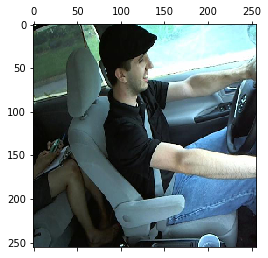

In [ ]:
img = image.load_img('/content/gdrive/MyDrive/DL/test.jpg', target_size=(256, 256))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)
plt.matshow(img)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in true_divide


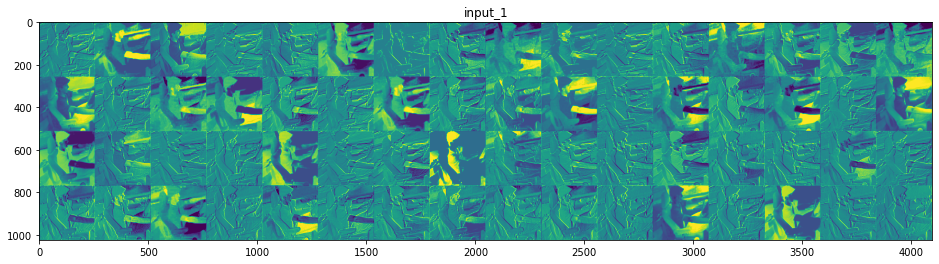

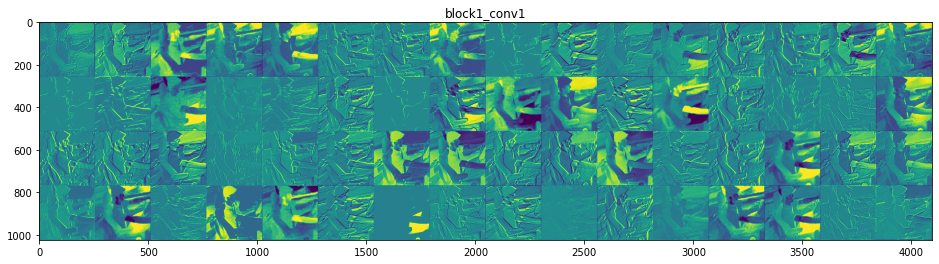

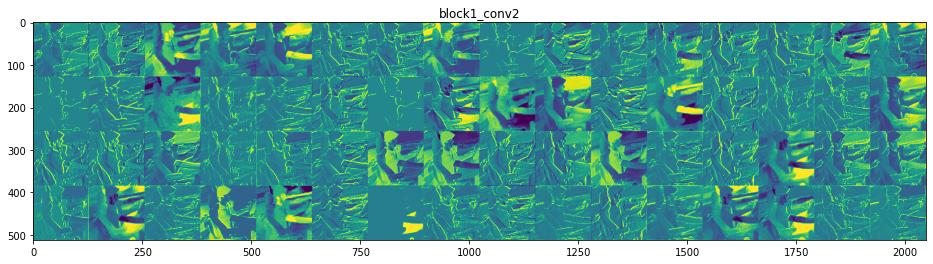

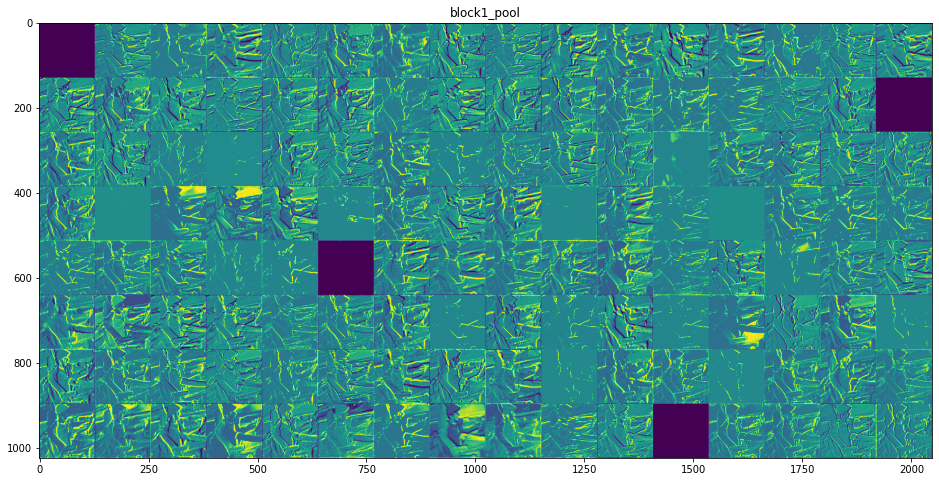

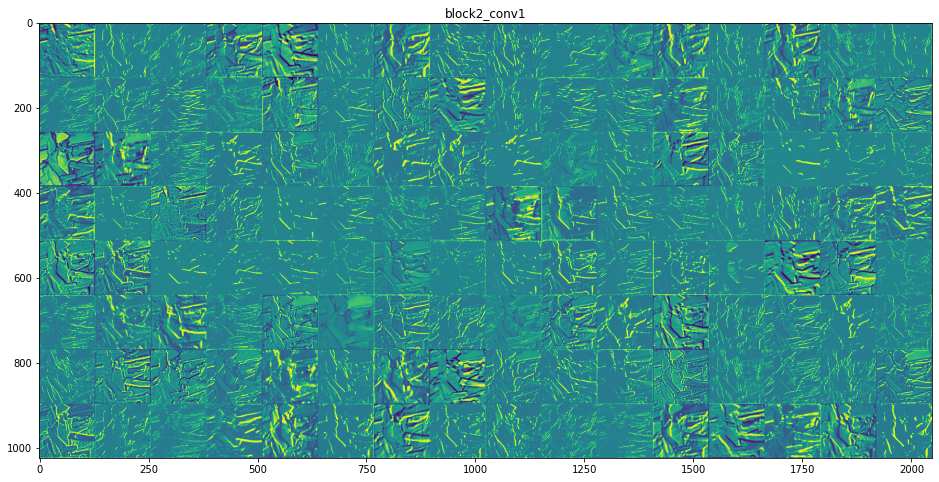

...

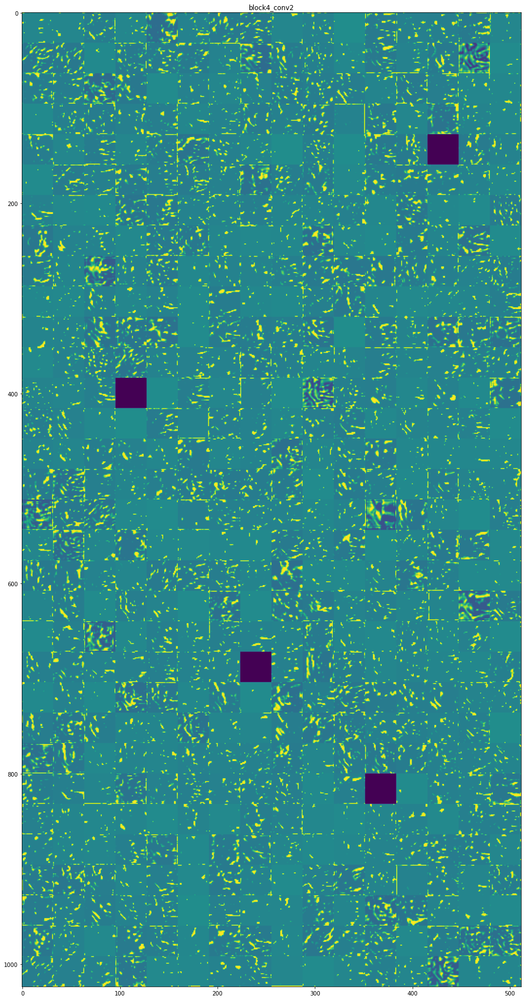

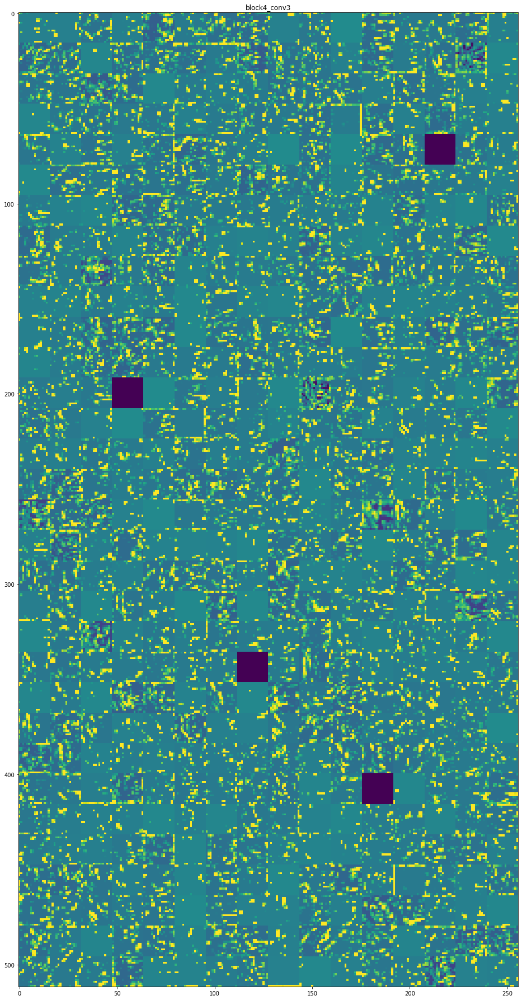

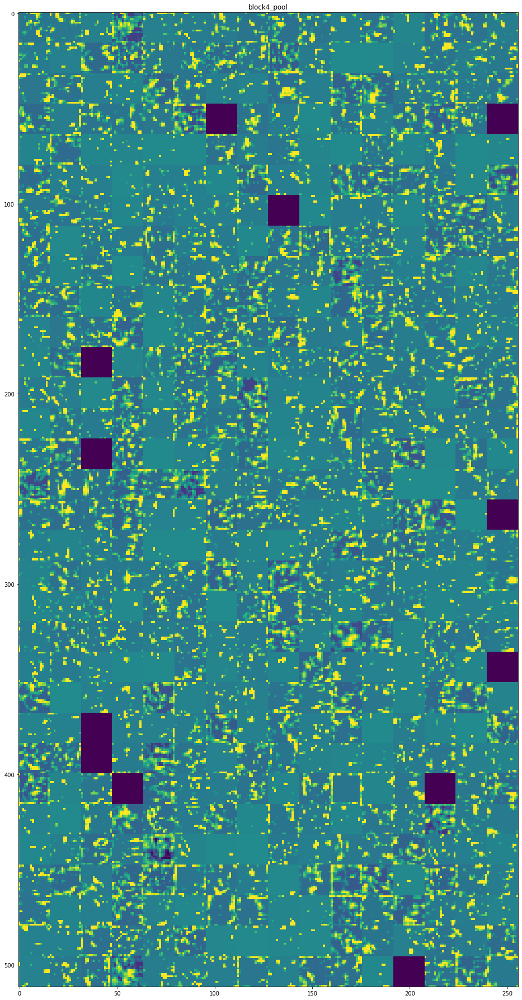

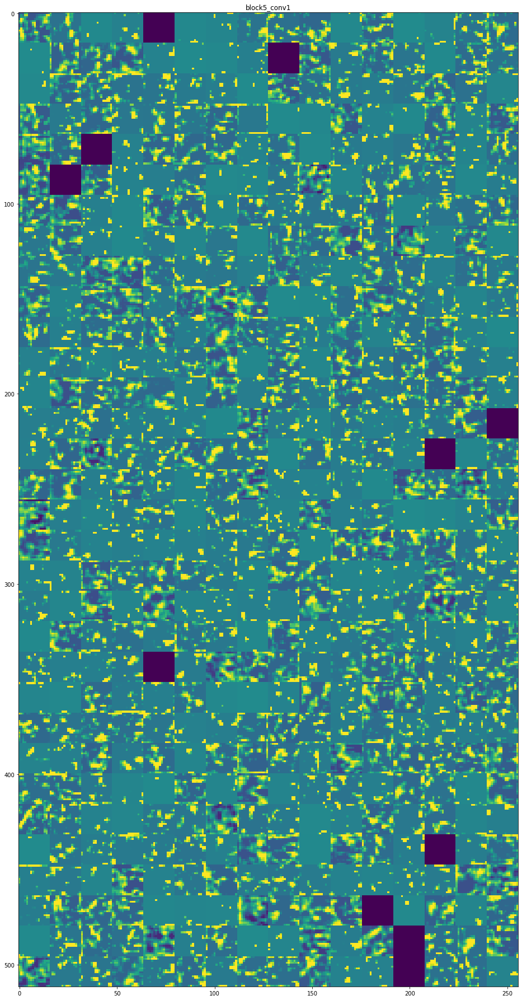

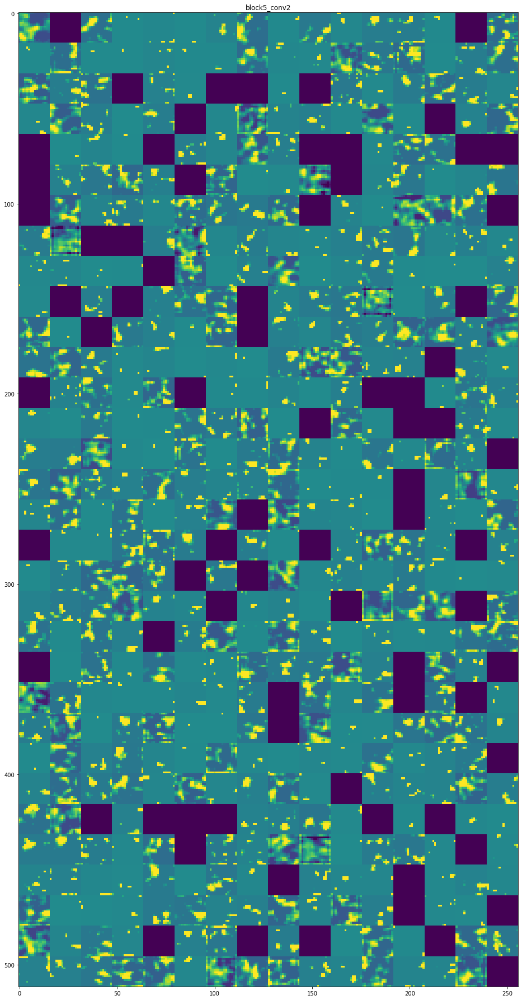

In [ ]:
layer_names = []
for layer in base.layers[:conv_count]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

#### 2- visualize heatmaps of class activation

In [ ]:
try:
  model = load_model('/content/gdrive/MyDrive/project_model.h5')
except OSError:
  print('model not found')

Instructions for updating:
Colocations handled automatically by placer.


In [ ]:
import tensorflow as tf

tf.compat.v1.disable_eager_execution()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 238, 238, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 238, 238, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 238, 238, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 238, 238, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 119, 119, 32)     0         
 )                                                               
                                                        

In [ ]:
# Sucess trial 
# The local path to our target image
img_path = '/content/gdrive/MyDrive/DL/test.jpg'

In [ ]:
img_array = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)
# new_img = cv2.resize(img_array,(224,224))
new_img = cv2.resize(img_array,(240,240))

In [ ]:
x = image.img_to_array(new_img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
# x = preprocess_input(x)
# x= x.reshape(-1,200,200,1)
x.shape

(1, 240, 240, 1)

In [ ]:
preds = model.predict(x)
# print('Predicted:', decode_predictions(preds, top=3))

/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
np.argmax(preds)

5

In [ ]:
print(preds)

[[2.4889536e-02 4.6373782e-04 3.6570983e-04 4.0084793e-05 7.6600090e-03
  9.5690966e-01 6.3131825e-04 4.1678972e-03 4.7992333e-03 7.2842151e-05]]


In [ ]:
first_layer_activation = preds[0]
print(first_layer_activation.shape)

(10,)


In [ ]:
# This is the "african elephant" entry in the prediction vector
african_elephant_output = model.output[:, 5]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('conv2d_4')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(128):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [ ]:
heatmap.shape

(60, 60)

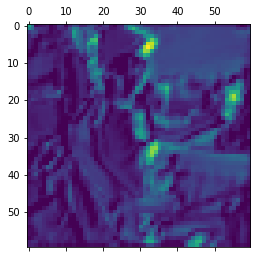

In [ ]:
import matplotlib.pyplot as plt
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('Heatmap.jpg', superimposed_img)

True

In [ ]:
from pylab import  imshow
img_path = 'Heatmap.jpg'
# img1=imread(img_path)
# imshow(img1)

In [ ]:
# img_path = 'cats_and_dogs_small/test/cats/cat.1700.jpg'

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


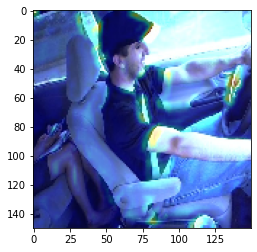

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()